In [1]:
import scipy.io as scio
import logging
from functools import lru_cache
import scipy.stats as st
import numpy as np
import os
from tqdm.auto import tqdm, trange
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset,DataLoader,SubsetRandomSampler
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import math
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
os.chdir('/Users/sheeta/Desktop/learn_torch/Task1')

In [2]:
#add label

# X = np.load("x_seq.npy")
# #control = 0, npc = 1
# control = np.full((1, 1761),0)
# npc = np.full((1,4147),1)
# label = np.concatenate((control, npc),axis = 1)
# wanted = []
# for i in range(len(label[0])):
#     wanted.append(np.array([X[i],label[0][i]],dtype=object))
# np.save("Seq_labeled.npy",wanted) 

## Dataloader

In [3]:
input_size = 678
output_size = 101
epochs = 3
batch_size = 10
random_seed= 42

#mixed, control 在前

In [17]:
class DataSplit:

    def __init__(self, dataset, test_train_split=0.8, val_train_split=0.1, shuffle=False):
        self.dataset = dataset
        dataset_size = len(dataset)
        print(dataset_size)
        self.indices = list(range(dataset_size))
        test_split = int(np.floor(test_train_split * dataset_size))

        if shuffle:
            np.random.shuffle(self.indices)

        train_indices, self.test_indices = self.indices[:test_split], self.indices[test_split:]
        train_size = len(train_indices)
        validation_split = int(np.floor((1 - val_train_split) * train_size))

        self.train_indices, self.val_indices = train_indices[ : validation_split], train_indices[validation_split:]

        self.train_sampler = SubsetRandomSampler(self.train_indices)
        self.val_sampler = SubsetRandomSampler(self.val_indices)
        self.test_sampler = SubsetRandomSampler(self.test_indices)

    def get_train_split_point(self):
        return len(self.train_sampler) + len(self.val_indices)

    def get_validation_split_point(self):
        return len(self.train_sampler)

    @lru_cache(maxsize=4)
    def get_split(self, batch_size=batch_size):
        logging.debug('Initializing train-validation-test dataloaders')
        self.train_loader = self.get_train_loader(batch_size=batch_size)
        self.val_loader = self.get_validation_loader(batch_size=batch_size)
        self.test_loader = self.get_test_loader(batch_size=batch_size)
        return self.train_loader, self.val_loader, self.test_loader

    @lru_cache(maxsize=4)
    def get_train_loader(self, batch_size=batch_size):
        logging.debug('Initializing train dataloader')
        self.train_loader = torch.utils.data.DataLoader(self.dataset,sampler=self.train_sampler, shuffle=False)
        return self.train_loader

    @lru_cache(maxsize=4)
    def get_validation_loader(self, batch_size=batch_size):
        logging.debug('Initializing validation dataloader')
        self.val_loader = torch.utils.data.DataLoader(self.dataset, sampler=self.val_sampler, shuffle=False)
        return self.val_loader

    @lru_cache(maxsize=4)
    def get_test_loader(self, batch_size=590):
        logging.debug('Initializing test dataloader')
        self.test_loader = torch.utils.data.DataLoader(self.dataset, sampler=self.test_sampler, shuffle=False)
        return self.test_loader
    
    

class NPCDataset(Dataset):
    def __init__(self, transform = None):
        #Dataloading
        self.x = np.load("Seq_labeled.npy",allow_pickle=True)
        self.y = np.load("y_seq.npy",allow_pickle=True)
        self.samples= len(self.x)
        self.transform = transform
    def __getitem__(self,index):
        #Dataset[0]
        ori = self.x[index][0]
        label = self.x[index][1]
        noise = self.y[index]
        sample = ori, noise,label
        if self.transform:
            sample = self.transform(sample)
        return sample
        
    def __len__(self):
        return self.samples
    

dataset = NPCDataset()
split = DataSplit(dataset, shuffle = True)

train_loader, val_loader, test_loader = split.get_split()


5908


In [5]:
tt = np.load("y_seq.npy",allow_pickle=True)

In [6]:
x, y,z= next(iter(val_loader)) 

In [9]:
dataset_size = len(dataset)

In [16]:
len(dataset)

5908

## Model(CNN)

In [7]:
class CNN(nn.Module):
    def __init__(self):
        super().__init__() 
        torch.manual_seed(20010315)
        self.conv1 = nn.Conv1d(1, 32,5 , padding = 2)
        self.conv2 = nn.Conv1d(32, 64, 5,padding = 2) 
        self.conv3 = nn.Conv1d(64, 128, 5,padding = 2)
        self.D = nn.Dropout(0.2)
   
        x = torch.randn(input_size).view(-1,1,input_size)
        self._to_linear = None
        self.convs(x)
        self.fc1 = nn.Linear(self._to_linear, output_size) #flattening.
    
    def convs(self, x):
        x = F.max_pool1d(F.relu(self.conv1(x)), (2))
        x = F.max_pool1d(F.relu(self.conv2(x)), (2))
        x = F.max_pool1d(F.relu(self.conv3(x)), (2))

        if self._to_linear is None:
            self._to_linear = x[0].shape[0]*x[0].shape[1]
        return x
    

    def forward(self, x):
        x = self.convs(x)
        x = x.view(-1, self._to_linear)  # .view is reshape ... this flattens X before 
        x = self.fc1(x) # bc this is our output layer. No activation here.
        return x
net = CNN()


/opt/anaconda3/lib/python3.8/site-packages/torch/nn/functional.py:652: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /Users/distiller/project/conda/conda-bld/pytorch_1623459044803/work/c10/core/TensorImpl.h:1156.)
  return torch.max_pool1d(input, kernel_size, stride, padding, dilation, ceil_mode)


## Training loop

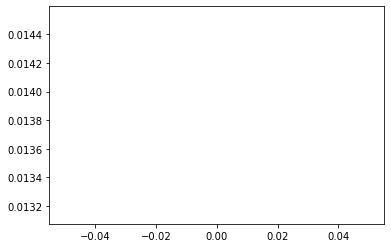

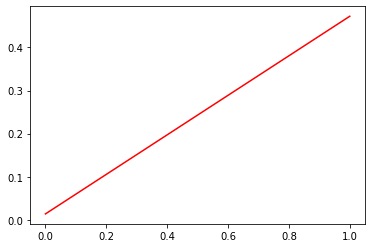

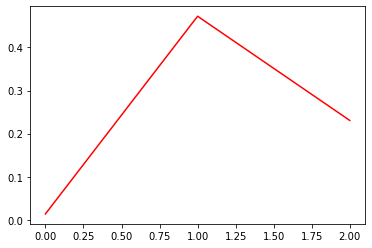

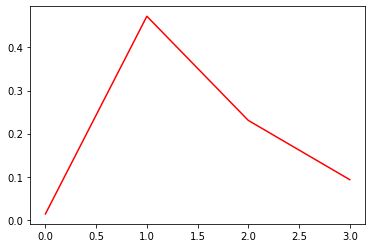

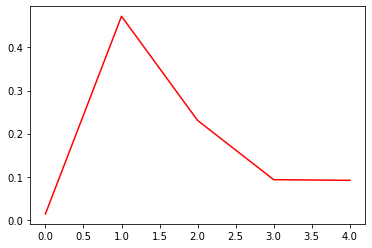

...

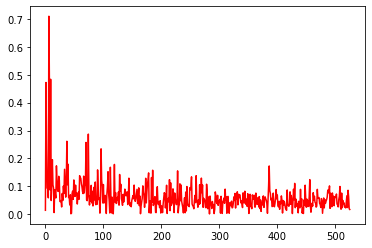

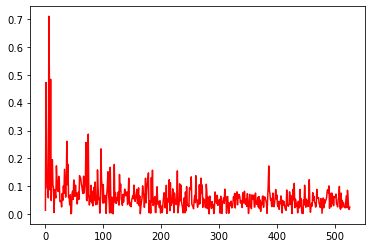

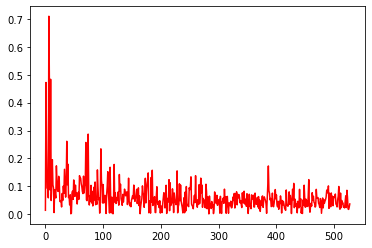

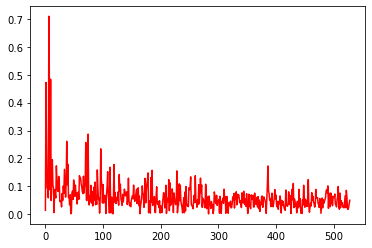

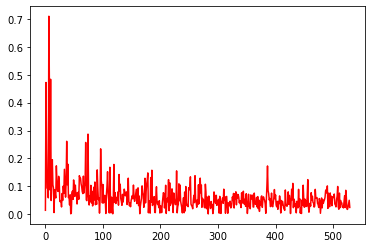

Epoch1,loss 0.0646743403850914


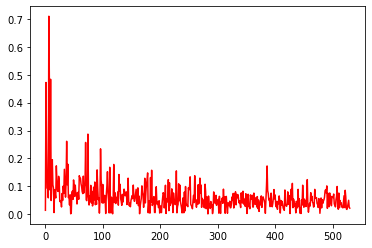

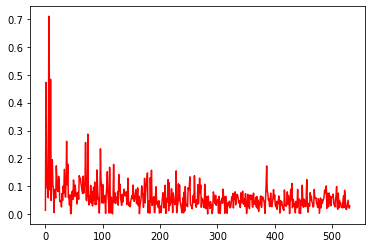

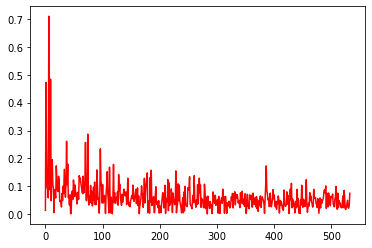

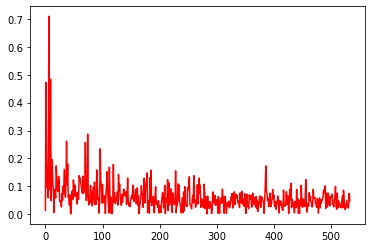

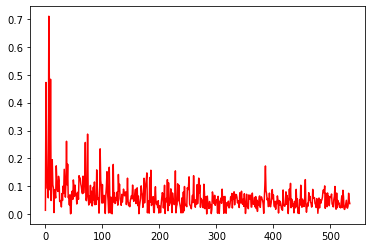

...

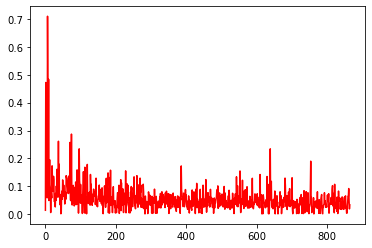

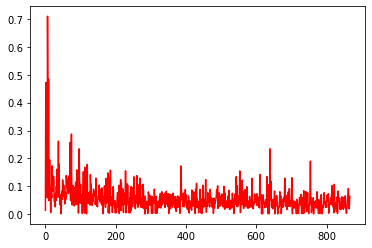

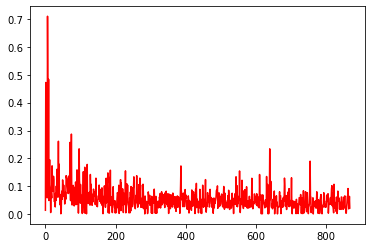

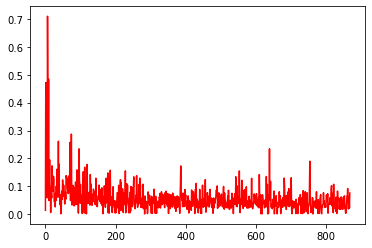

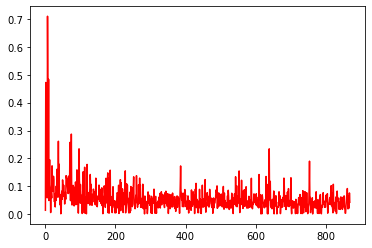

KeyboardInterrupt: 

In [155]:
#loss and optimizer
loss_function = nn.CrossEntropyLoss()

optimizer = optim.Adam(net.parameters(), lr=0.001)

#training loop
losses_train = []
losses_val = []

n_total_step = len(train_loader)
for e in range(epochs):
    for i, (ori, noise,label) in enumerate(train_loader):
        ori = ori.view(-1,1,input_size).to(device)
        noise = noise.to(device)
        #forward pass
        output = net(ori)
        loss = loss_function(output,noise)
        
        #backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        #Train loss
        if (i+1)%40 ==0:
            losses_train.append(loss.item())
#             plt.plot(losses_train, color = 'blue')
#             plt.show() 
            net.eval()
            with torch.no_grad():
                for j, (ori, noise,label) in enumerate(val_loader):
                    ori = ori.view(-1,1,input_size).to(device)
                    noise = noise.to(device)
                    output = net(ori)
                    loss = loss_function(output,noise)
            #validation loss
                    if (j+1)%80 ==0:
                        losses_val.append(loss.item())
                        plt.plot(losses_val, color = 'red')
                        plt.show()  
                    
    print(f'Epoch{e+1},loss {sum(losses_train) / len(losses_train)}')
    print(f'Epoch{e+1},loss {sum(losses_val) / len(losses_val)}')
    
        


In [161]:
#test 
def test():
    i = 0
    with torch.no_grad():
        for (ori,noise,label) in val_loader:

            ori = ori.view(-1,1,input_size).to(device)
            noise = noise.to(device)
            output = net(ori)
            loss = loss_function(output,noise)
    
            output = output.detach().numpy()
            score  = [r2_score(i,j) for i, j in zip(output,noise)]
            score = np.mean(score)
            
    return loss,score

loss, r2score = test()
print(loss,r2score)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

## Visualization

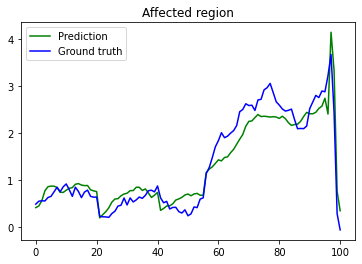

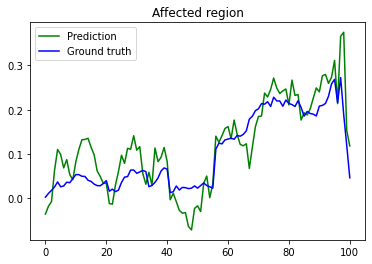

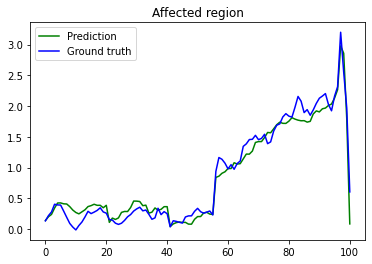

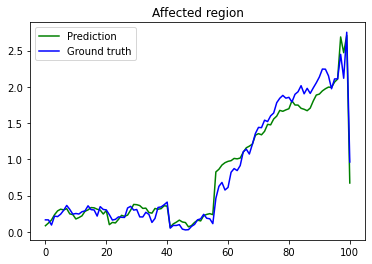

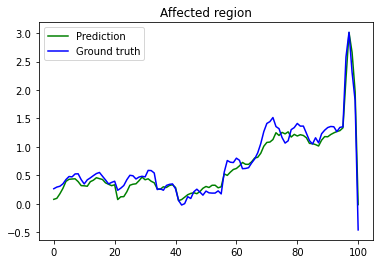

...

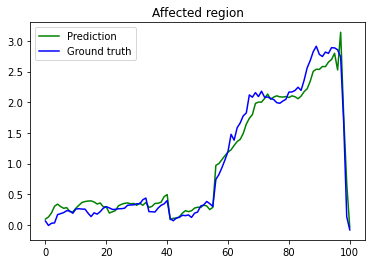

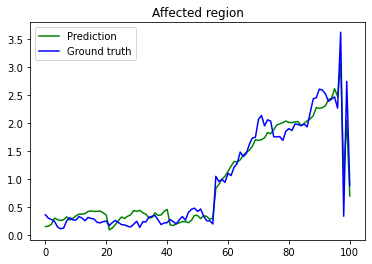

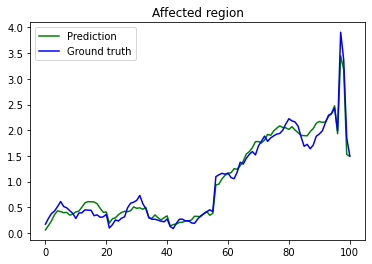

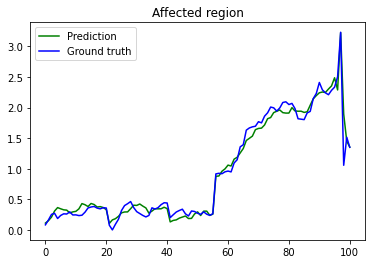

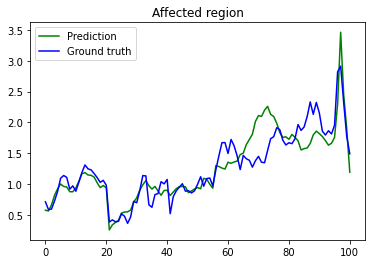

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [159]:
def outputnoise():
    with torch.no_grad():
        for (ori,noise,label) in test_loader:
            ori = ori.view(-1,1,input_size).to(device)
            noise = noise.to(device)
            output = net(ori).detach().numpy()
            plt.title('Affected region')
            plt.plot(output[0],color='green',label = 'Prediction')
            plt.plot(noise[0],color='blue', label = 'Ground truth')
            plt.legend()
            plt.show()
outputnoise()

In [29]:
torch.save(net,'CNN_seqtoseq.pth' )

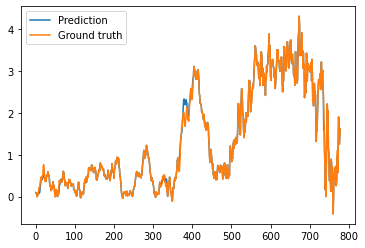

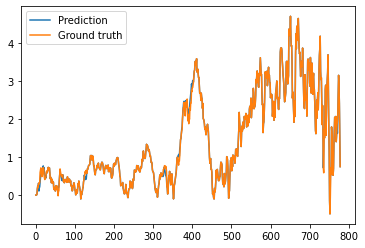

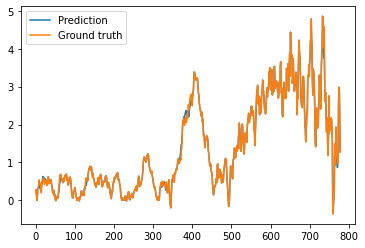

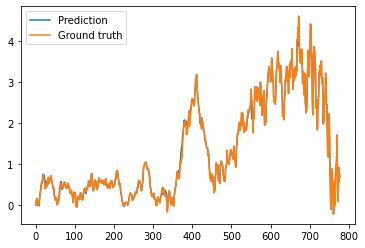

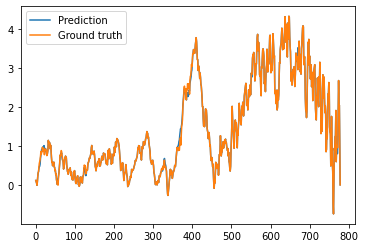

...

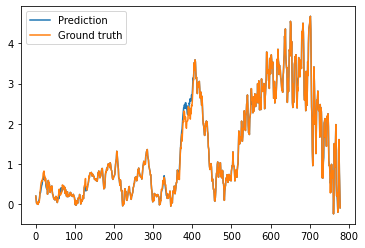

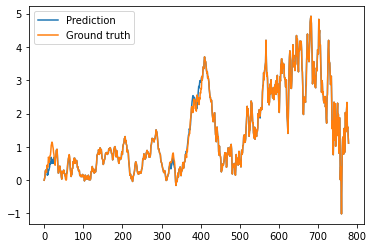

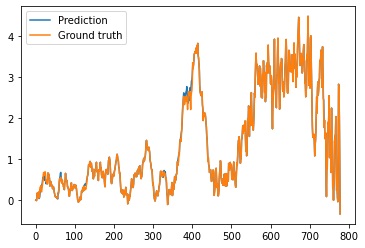

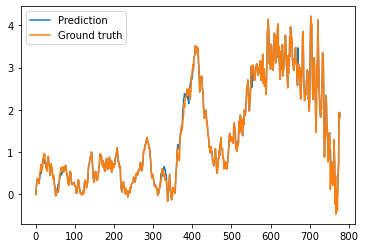

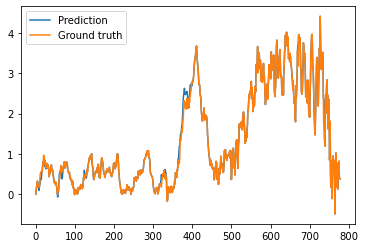

KeyboardInterrupt: 

In [15]:
X = np.load("output_total.npy",allow_pickle=True)
y = np.load("golden_standard.npy", allow_pickle=True)
def output():
    for i in range(len(X)):
        output = X[i]
        ground_truth = y[i]

        plt.plot(output, label = 'Prediction')
        plt.plot(ground_truth, label = 'Ground truth') 
        plt.legend()
        plt.show()
output()

## Write out

In [177]:
# def count_test():
#     num = 0
#     for (ori,noise,label) in test_loader:
#         num+=1
#     return num
# a = count_test()
# a = 1182

In [202]:
#light index and light data

lightdata = scio.loadmat('Room_light.mat')
lightdata = torch.Tensor(lightdata['light'])
light = torch.transpose(lightdata,0,1)
noiselist = []
for i in range(779):
    if light[0][i]>0.13:
        noiselist.append(i)
    


In [208]:
outputlist = []
truelist = []
for (ori,noise,label) in test_loader:

    inputs = ori.view(-1,1,input_size).to(device)
    output = net(inputs)
    pred_noise = output.detach().numpy()
    outputarray = []
    true = []
    noiseidx = 0
    orindex = 0
    for index in range(779):
        if index in noiselist:
            true.append(noise[0][noiseidx])
            outputarray.append(pred_noise[0][noiseidx])
            noiseidx += 1
        else:
            true.append(ori[0][orindex])
            outputarray.append(ori[0][orindex])
            orindex+=1
    outputlist.append(np.array([np.array(outputarray),np.array(label)],dtype=object))  
    truelist.append(np.array([np.array(true),np.array(label)],dtype=object))

In [213]:
np.save("output_test.npy", outputlist)
np.save("golden_test.npy", truelist)